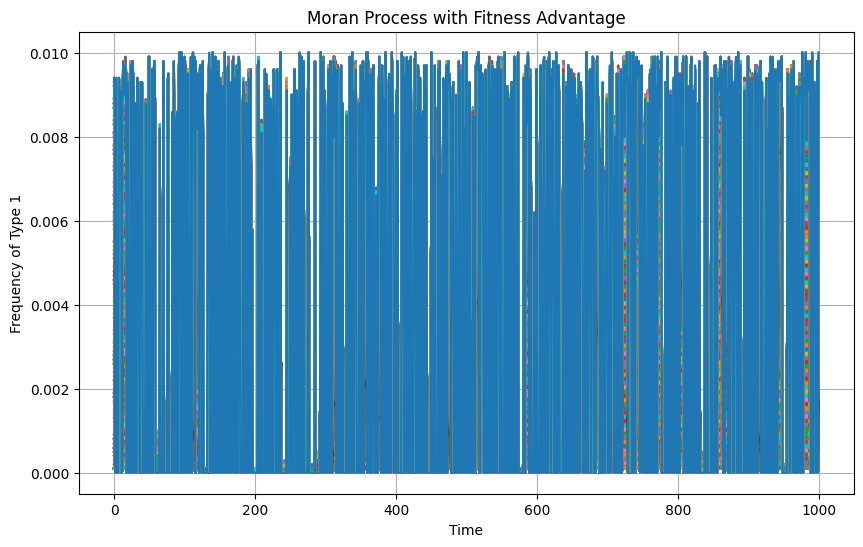

In [21]:
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.pyplot as plt
import multiprocessing as mp
from functools import partial

class MoranModel:
    def __init__(self, population_size=100, mutation_rate=0.001, fitness_advantage=1.1):
        self.N = population_size
        self.mu = mutation_rate  # mutation rate
        self.w = fitness_advantage  # fitness advantage of type 1
        
        # Initialize population with all type 0 individuals
        self.population = np.zeros(self.N, dtype=int)
        
    def step(self):
        """Perform one step of the Moran process"""
        # Count types
        count_1 = np.sum(self.population)
        count_0 = self.N - count_1
        
        # Calculate fitness-weighted probabilities for reproduction
        fitness_0 = 1.0 * count_0
        fitness_1 = self.w * count_1
        total_fitness = fitness_0 + fitness_1
        
        # Select individual to reproduce based on fitness
        if np.random.random() < fitness_1 / total_fitness:
            offspring_type = 1
        else:
            offspring_type = 0
            
        # Apply mutation
        # if np.random.random() < self.mu:
        #     offspring_type = 1 - offspring_type
        
        # Select random individual to die
        death_idx = np.random.randint(0, self.N)
        
        # Replace with offspring
        self.population[death_idx] = offspring_type
        
    def run(self, steps=1000):
        """Run the model for a specified number of steps"""
        history = np.zeros(steps+1, dtype=int)
        history[0] = np.sum(self.population)
        
        for i in range(steps):
            self.step()
            history[i+1] = np.sum(self.population)
            
        return history
    
    def run_simulation(self, steps, initial_count=1, seed=None):
        """Run a single simulation with given parameters and seed"""
        if seed is not None:
            np.random.seed(seed)
            
        # Reset and initialize population
        self.population = np.zeros(self.N, dtype=int)
        self.population[:initial_count] = 1
        
        return self.run(steps)
        
    def run_parallel_simulations(self, num_simulations=1000, steps=1000, initial_count=1):
        """Run multiple simulations in parallel"""
        # Create a pool of workers
        with mp.Pool(processes=mp.cpu_count()) as pool:
            # Create seeds for reproducibility
            seeds = np.random.randint(0, 2**32, size=num_simulations)
            
            # Create partial function with fixed parameters
            sim_func = partial(self._run_single_sim, steps=steps, initial_count=initial_count)
            
            # Run simulations in parallel
            results = pool.map(sim_func, seeds)
            
        return np.array(results)
    
    def _run_single_sim(self, seed, steps, initial_count):
        """Helper function for parallel processing"""
        # Create a copy of the model to avoid shared state issues
        model_copy = MoranModel(self.N, self.mu, self.w)
        return model_copy.run_simulation(steps, initial_count, seed) / model_copy.N
    
    def visualize(self, steps=1000):
        """Create and visualize a simulation"""
        # Start with one mutant
        self.population = np.zeros(self.N, dtype=int)
        self.population[0] = 1
        
        fig, ax = plt.subplots(figsize=(10, 6))
        history = np.zeros(steps+1)
        history[0] = 1
        
        line, = ax.plot([0], [history[0]/self.N], 'r-')
        ax.set_xlim(0, steps)
        ax.set_ylim(0, 1)
        ax.set_xlabel('Time')
        ax.set_ylabel('Frequency of Type 1')
        ax.set_title('Moran Process')
        
        def update(frame):
            self.step()
            history[frame] = np.sum(self.population) / self.N
            line.set_data(range(frame+1), history[:frame+1])
            return line,
        
        ani = FuncAnimation(fig, update, frames=steps, blit=True, interval=20)
        plt.close()  # Prevent duplicate display
        return HTML(ani.to_jshtml())

# Example usage
model = MoranModel(population_size=100, mutation_rate=0.001, fitness_advantage=2)

# Introduce one mutant
model.population[0] = 1

# Run simulation
# history = model.run(steps=1000)
history = model.run_parallel_simulations(num_simulations=1000, steps=1000, initial_count=1)

plt.figure(figsize=(10, 6))
plt.plot(history / model.N)
plt.xlabel('Time')
plt.ylabel('Frequency of Type 1')
plt.title('Moran Process with Fitness Advantage')
plt.grid(True)
plt.show()

# Run interactive visualization
model.visualize(steps=500)

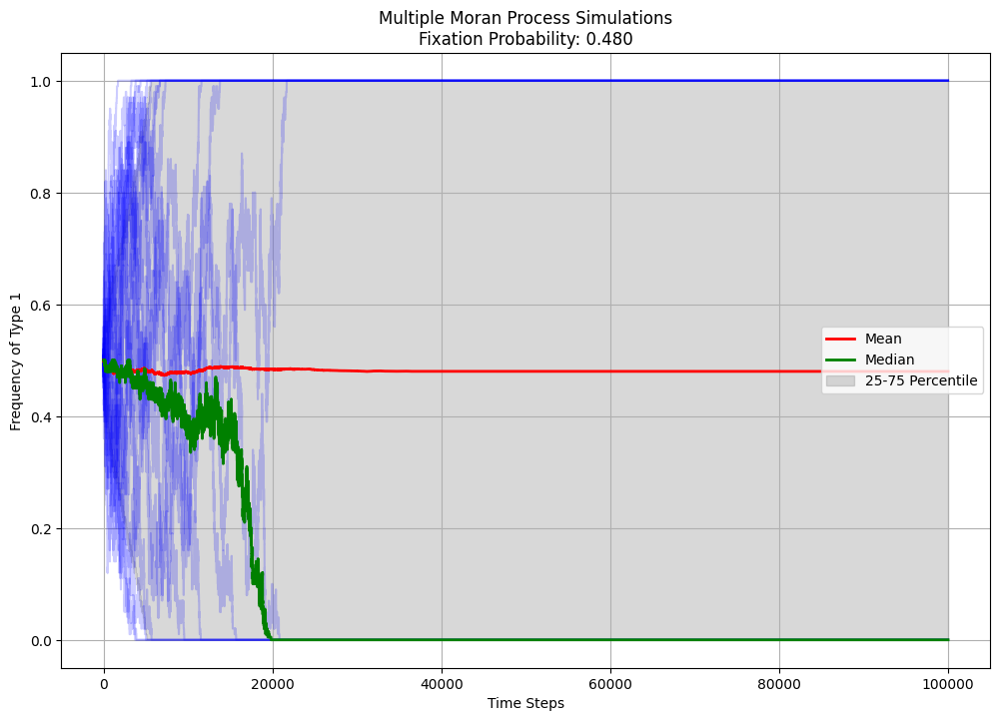

Fixation probability (exact=1.0): 0.480
Fixation probability (threshold>=0.99): 0.480
Extinction probability (exact=0.0): 0.520
Extinction probability (threshold<=0.01): 0.520
Incomplete runs (exact): 0.000
Incomplete runs (threshold): 0.000


In [24]:
# Run multiple simulations and analyze the outcomes
num_simulations = 1000
steps = 100000

plt.figure(figsize=(12, 8))

# Set up the model with neutral fitness
model = MoranModel(population_size=100, mutation_rate=0.001, fitness_advantage=1)

# Run parallel simulations starting with 50 mutants (50% frequency)
results = model.run_parallel_simulations(num_simulations=num_simulations, 
                                         steps=steps, 
                                         initial_count=50)

# Plot the first 20 trajectories
for i in range(20):
    plt.plot(results[i], 'b-', alpha=0.2)

# Calculate statistics
mean_trajectory = np.mean(results, axis=0)
median_trajectory = np.median(results, axis=0)
lower_bound = np.percentile(results, 25, axis=0)
upper_bound = np.percentile(results, 75, axis=0)

# Plot summary statistics
plt.plot(mean_trajectory, 'r-', linewidth=2, label='Mean')
plt.plot(median_trajectory, 'g-', linewidth=2, label='Median')
plt.fill_between(range(steps+1), lower_bound, upper_bound, color='gray', alpha=0.3, label='25-75 Percentile')

# Calculate fixation and extinction probabilities
# Using exact values (0 and 1) for more accurate counting
fixation_count = np.sum(results[:, -1] == 1.0)
extinction_count = np.sum(results[:, -1] == 0.0)

# Also calculate with threshold for comparison
fixation_threshold = np.sum(results[:, -1] >= 0.99)
extinction_threshold = np.sum(results[:, -1] <= 0.01)

fixation_prob = fixation_count / num_simulations
fixation_prob_threshold = fixation_threshold / num_simulations

plt.xlabel('Time Steps')
plt.ylabel('Frequency of Type 1')
plt.title(f'Multiple Moran Process Simulations\nFixation Probability: {fixation_prob:.3f}')
plt.legend()
plt.grid(True)
plt.show()

print(f"Fixation probability (exact=1.0): {fixation_prob:.3f}")
print(f"Fixation probability (threshold>=0.99): {fixation_prob_threshold:.3f}")
print(f"Extinction probability (exact=0.0): {extinction_count/num_simulations:.3f}")
print(f"Extinction probability (threshold<=0.01): {extinction_threshold/num_simulations:.3f}")
print(f"Incomplete runs (exact): {(num_simulations - fixation_count - extinction_count)/num_simulations:.3f}")
print(f"Incomplete runs (threshold): {(num_simulations - fixation_threshold - extinction_threshold)/num_simulations:.3f}")
